In [612]:
import pandas as pd
import seaborn as sns
import matplotlib.pyplot as plt

In [613]:
df = pd.read_csv("Data/RefinedFile.csv", na_values='-', index_col=0)

df

,Date Rptd,DATE OCC,TIME OCC,AREA,AREA NAME,Rpt Dist No,Part 1-2,Crm Cd,Crm Cd Desc,Mocodes,...,Weapon Desc,Status,Status Desc,Crm Cd 1,Crm Cd 2,Crm Cd 3,Crm Cd 4,Time AM,Time PM,Sun
DR_NO,,,,,,,,,,,,,,,,,,,,,
10304468,01/08/2020,01/08/2020,2230,3,Southwest,377,2,624,BATTERY - SIMPLE ASSAULT,0444 0913,...,"STRONG-ARM (HANDS, FIST, FEET OR BODILY FORCE)",AO,Adult Other,624.0,NaN,NaN,NaN,659,1700,Night
190101086,01/02/2020,01/01/2020,330,1,Central,163,2,624,BATTERY - SIMPLE ASSAULT,0416 1822 1414,...,UNKNOWN WEAPON/OTHER WEAPON,IC,Invest Cont,624.0,NaN,NaN,NaN,658,1654,Night
191501505,01/01/2020,01/01/2020,1730,15,N Hollywood,1543,2,745,VANDALISM - MISDEAMEANOR ($399 OR UNDER),0329 1402,...,NaN,IC,Invest Cont,745.0,998.0,NaN,NaN,658,1654,Night
191921269,01/01/2020,01/01/2020,415,19,Mission,1998,2,740,"VANDALISM - FELONY ($400 & OVER, ALL CHURCH VA...",0329,...,NaN,IC,Invest Cont,740.0,NaN,NaN,NaN,658,1654,Night
200100501,01/02/2020,01/01/2020,30,1,Central,163,1,121,"RAPE, FORCIBLE",0413 1822 1262 1415,...,UNKNOWN WEAPON/OTHER WEAPON,IC,Invest Cont,121.0,998.0,NaN,NaN,658,1654,Night
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
231604807,01/27/2023,01/26/2023,1800,16,Foothill,1663,2,740,"VANDALISM - FELONY ($400 & OVER, ALL CHURCH VA...",1300 0329,...,NaN,IC,Invest Cont,740.0,NaN,NaN,NaN,653,1717,Night
231606525,03/22/2023,03/22/2023,1000,16,Foothill,1602,1,230,"ASSAULT WITH DEADLY WEAPON, AGGRAVATED ASSAULT",0416 0411 1822,...,"STRONG-ARM (HANDS, FIST, FEET OR BODILY FORCE)",IC,Invest Cont,230.0,NaN,NaN,NaN,654,1906,Day
231210064,04/12/2023,04/12/2023,1630,12,77th Street,1239,1,230,"ASSAULT WITH DEADLY WEAPON, AGGRAVATED ASSAULT",0601 0445 0416 0359,...,UNKNOWN WEAPON/OTHER WEAPON,IC,Invest Cont,230.0,NaN,NaN,NaN,625,1922,Day


# Basic Statistic

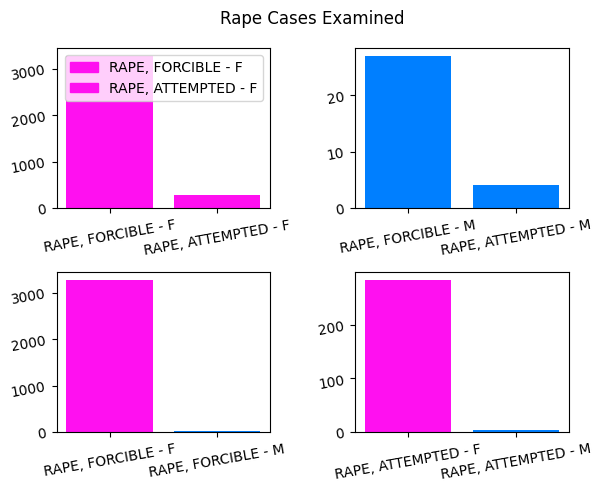

<Figure size 5000x2400 with 0 Axes>

In [614]:
# def create_axs():
rapeCases = df[["Crm Cd Desc", "Vict Sex"]]

rapeCases = rapeCases[rapeCases["Crm Cd Desc"].str.contains("RAPE", case=False)]
# rapeCases = rapeCases[rapeCases["Vict Sex"] == "M"]

rapeValues = rapeCases.value_counts()

categories = [f'{x[0]} - {x[1]}' for x in list(rapeValues.keys())]
counts = list(rapeValues.values)
colors=["#007FFF" if x[1]=="M" else "#FF10F0" for x in list(rapeValues.keys())]

fig, axs = plt.subplots(2,2)
plt.subplots_adjust(left=0.1, bottom=0.1, right=0.9, top=0.9, wspace=0.4,hspace=0.4)
fig.suptitle('Rape Cases Examined')

axs[0,0].bar(categories[:2], counts[:2], color=colors[:2])
handles = [plt.Rectangle((0,0),1,1, color=color) for color in colors[:2]]
axs[0,0].legend(handles, categories[:2], loc="best")

axs[0,1].bar(categories[2:], counts[2:], color=colors[2:])

axs[1,0].bar(categories[::2], counts[::2], color=colors[::2])

axs[1,1].bar(categories[1::2], counts[1::2], color=colors[1::2])

for i in range(2):
    for j in range(2):
        axs[i, j].tick_params(labelrotation=10)

plt.figure(figsize=(50, 24))
plt.show()

In [615]:
invStatus = df["Status Desc"].value_counts()

total = sum(invStatus)

print(invStatus)
print("*"*35)
print(f'Total Crimes: {total}')
print(f'{round((sum(invStatus[3:5])/total)*100, 2)}% of Cases are Juvenile Related')
print(f'{round((sum(invStatus[2:4])/total)*100, 2)}% of Cases Resulted in Arrest')
print(f'{invStatus[5]} Cases are Unknown')

Status Desc
Invest Cont     485073
Adult Other      82628
Adult Arrest     56878
Juv Arrest        2106
Juv Other         1223
UNK                  4
Name: count, dtype: int64
***********************************
Total Crimes: 627912
0.53% of Cases are Juvenile Related
9.39% of Cases Resulted in Arrest
4 Cases are Unknown


/var/folders/1r/nhfv97zj4b1dcm5q0rvk4nt00000gn/T/ipykernel_986/3398895433.py:10: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  print(f'{invStatus[5]} Cases are Unknown')


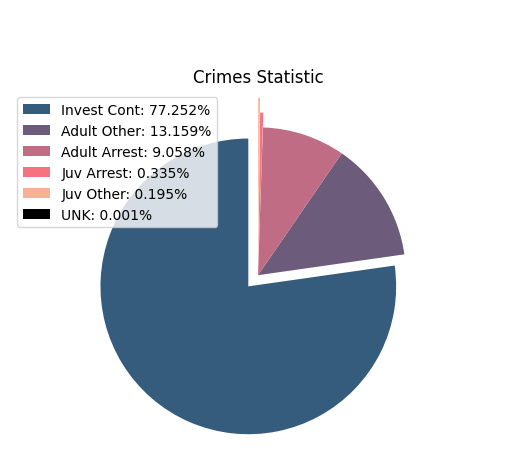

In [616]:
import matplotlib.pyplot as plt

# Example data
labels = [f'{x}: {round((y/total)*100, 3)}%' for x, y in invStatus.items()]
sizes = [x/total for x in invStatus]  # Example values for each category

# Six hex colors for a pie chart
colors = ['#355C7D', '#6C5B7B', '#C06C84', '#F67280', '#F8B195', '#000']

# Exploding a particular section (if needed)
explode = (0.1, 0, 0, 0.1, 0.2, 0.8)  # This will "explode" the 1st slice (A)

# Create pie chart
fig, ax = plt.subplots()
# ax.pie(sizes, labels=labels, colors=colors, autopct='%1.1f%%', startangle=90, explode=explode, shadow=True)

# Equal aspect ratio ensures that pie is drawn as a circle
ax.axis('equal')

patches, texts = plt.pie(sizes, colors=colors, startangle=90, explode=explode, shadow=False)
plt.legend(patches, labels, loc="best")

# Title
plt.title('Crimes Statistic')

# Show the pie chart
plt.show()


# Heatmap of Crimes (Give DF)

In [617]:
def truncate(crime_dict, start, end):
    slim_crimes = crime_dict.copy()
    to_remove = []

    for k in slim_crimes.keys():
        if (sum(slim_crimes[k].values()) < start) or (sum(slim_crimes[k].values()) > end):
            to_remove.append(k)

    for k in to_remove:
        slim_crimes.pop(k)
    return slim_crimes


def show_heatmap(crime_dict, title, start, end, figx=30, figy=16, annot=False):

    sub = truncate(crime_dict, start, end)
    # Create DataFrame from the dictionary
    df1 = pd.DataFrame(sub)

    # Transpose the DataFrame and set the index to 'Crime'
    df1 = df1.transpose().reset_index().rename(columns={'index': 'Crime'})
    df1.set_index('Crime', inplace=True)

    plt.figure(figsize=(figx, figy))
    plt.title(f'{title} ({start}-{end})', fontsize=72)
    sns.heatmap(df1, annot=annot)

# Crimes and Number of Times the happeneds in a given day

In [618]:
import datetime
import calendar

def sort_inner_dict_keys(data):
    for key, inner_dict in data.items():
        data[key] = {calendar.day_name[k]: v for k, v in sorted(inner_dict.items())}
    return data

crimes = df[["Crm Cd Desc", "DATE OCC"]]

grouped = df.groupby(["Crm Cd Desc", "DATE OCC"]).size().reset_index(name='Count')

weekday_crime = {}

for _, row in grouped.iterrows():
    crime = row['Crm Cd Desc']
    crime_day = row['DATE OCC']
    count = row['Count']
 
    if crime not in weekday_crime:
        weekday_crime[crime] = {}

    date_object = datetime.datetime.strptime(crime_day, '%m/%d/%Y')

    ## Get the weekday as an integer (0 for Monday, 1 for Tuesday, ..., 6 for Sunday)
    weekday_name = date_object.weekday()

    # ## Convert the integer weekday to the corresponding weekday name
    # weekday_name = datetime.date(1900, 1, 1 + weekday).strftime('%A')
    
    if weekday_name not in weekday_crime[crime]:
        weekday_crime[crime][weekday_name] = count
    else:
        weekday_crime[crime][weekday_name] += count

weekday_crime = sort_inner_dict_keys(weekday_crime)

# weekday_crime

# Crimes and Day or Night

In [619]:
crimes = df[["Crm Cd Desc", "Sun"]]

# print(sum(crimes[crimes["Crm Cd Desc"] == "ARSON"].value_counts()))

grouped = df.groupby(["Crm Cd Desc", "Sun"]).size().reset_index(name='Count')

light_crime = {}

for _, row in grouped.iterrows():
    crime = row['Crm Cd Desc']
    day_light = row['Sun']
    count = row['Count']
    
    if crime not in light_crime:
        light_crime[crime] = {}
    
    if day_light not in light_crime[crime]:
        light_crime[crime][day_light] = count
    else:
        light_crime[crime][day_light] += count

# crime_dict

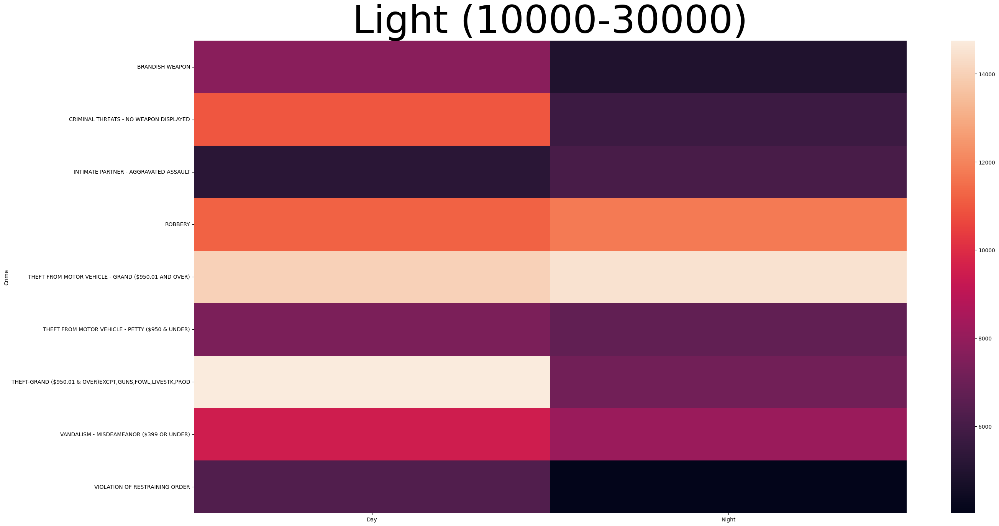

In [620]:
show_heatmap(light_crime, "Light", 10000, 30000)

# Crimes and number of Times they happenned in a given hour

In [621]:
crimes = df[["Crm Cd Desc", "TIME OCC"]]

# print(sum(crimes[crimes["Crm Cd Desc"] == "ARSON"].value_counts()))

grouped = df.groupby(["Crm Cd Desc", "TIME OCC"]).size().reset_index(name='Count')

hour_crime = {}

for _, row in grouped.iterrows():
    crime = row['Crm Cd Desc']
    crime_time = row['TIME OCC']
    count = row['Count']
    
    if crime not in hour_crime:
        hour_crime[crime] = {}
    
    if crime_time//100 not in hour_crime[crime]:
        hour_crime[crime][crime_time//100] = count
    else:
        hour_crime[crime][crime_time//100] += count

# crime_dict

# Heatmap of Crimes According to Time

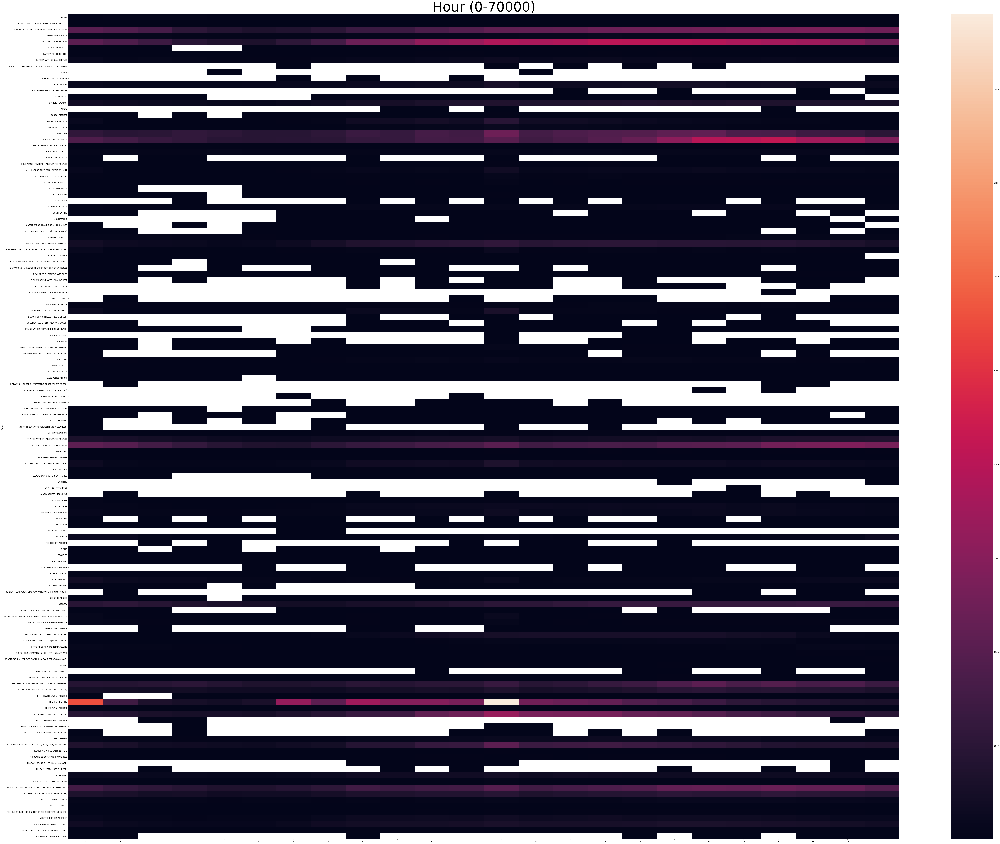

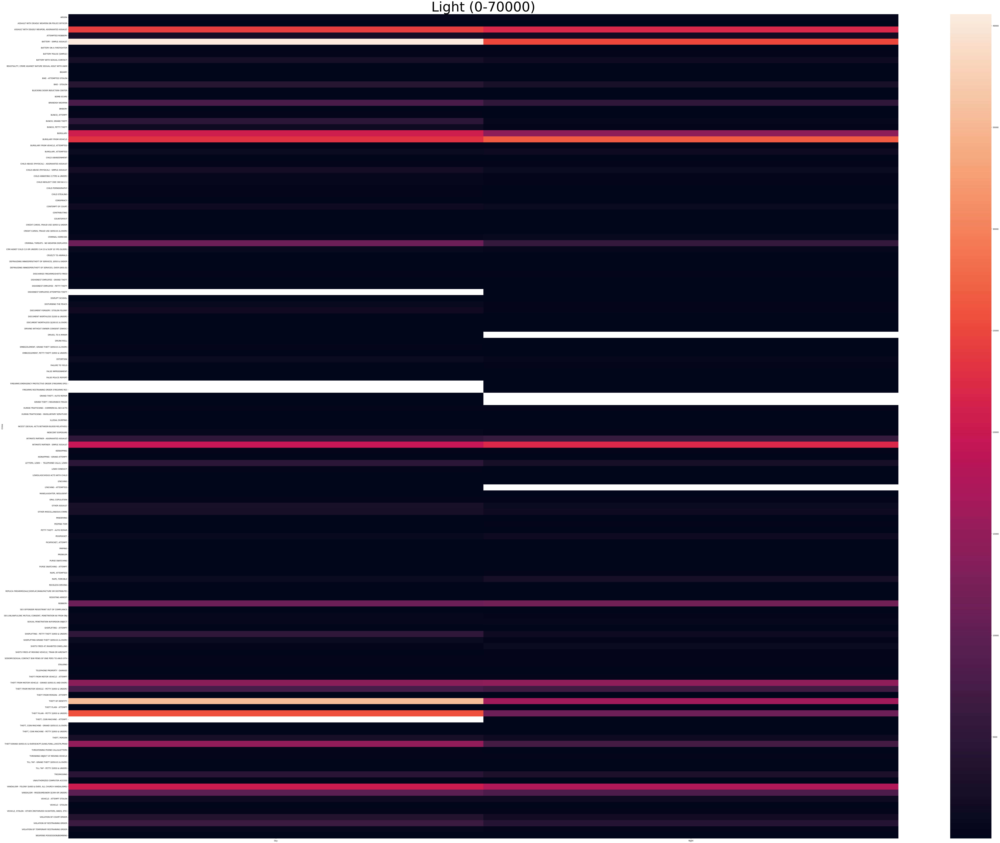

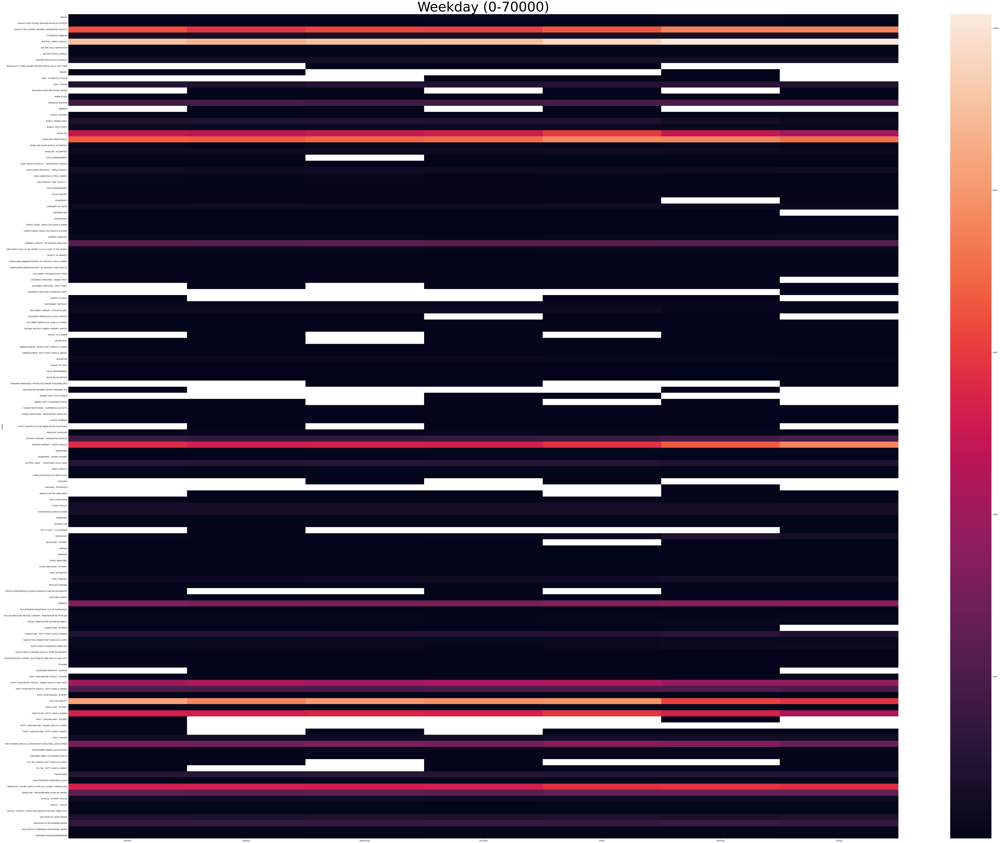

In [622]:
start, to = 0, 70000

show_heatmap(hour_crime, "Hour", start, to, 100, 80)
show_heatmap(light_crime, "Light", start, to, 100, 80)
show_heatmap(weekday_crime, "Weekday", start, to, 100, 80)

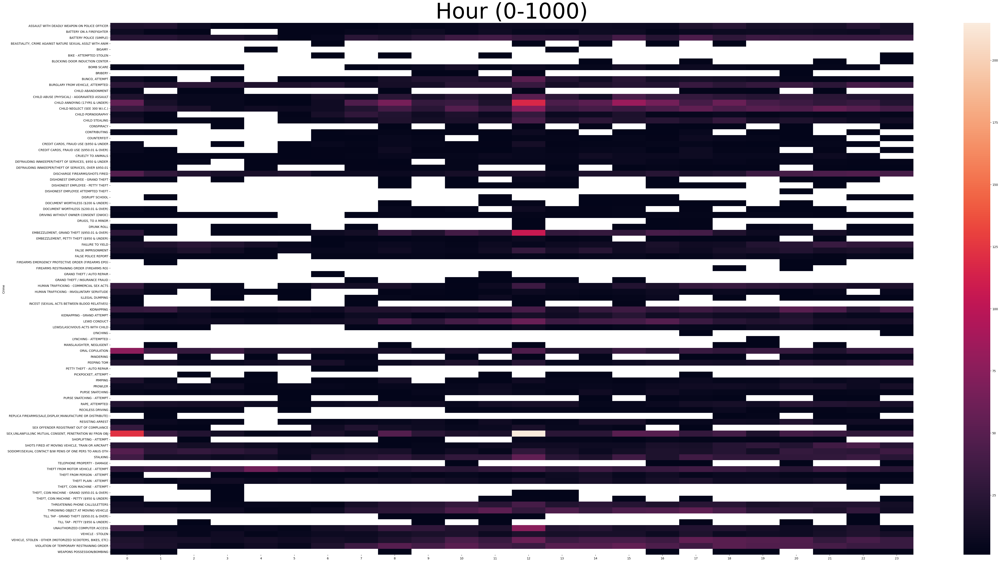

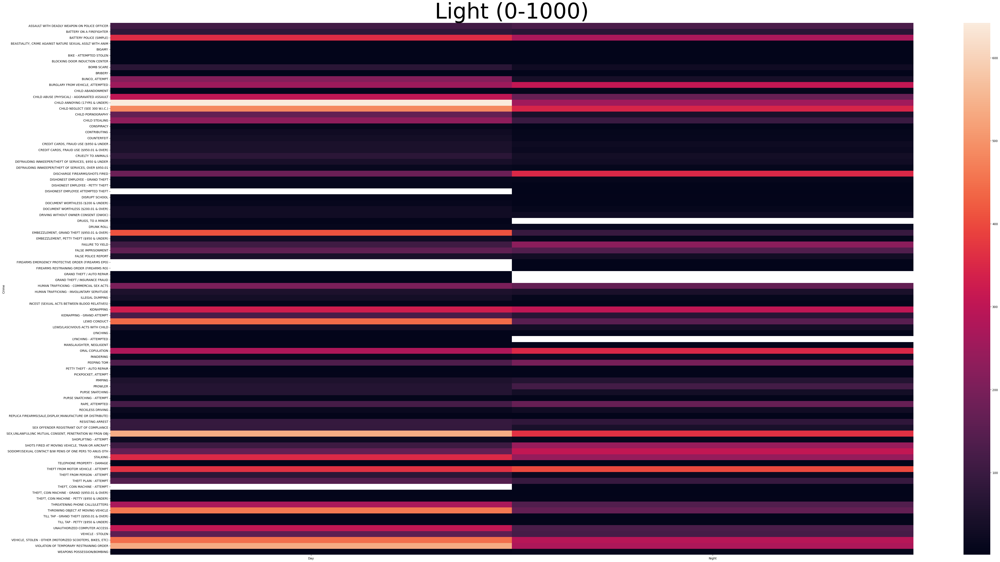

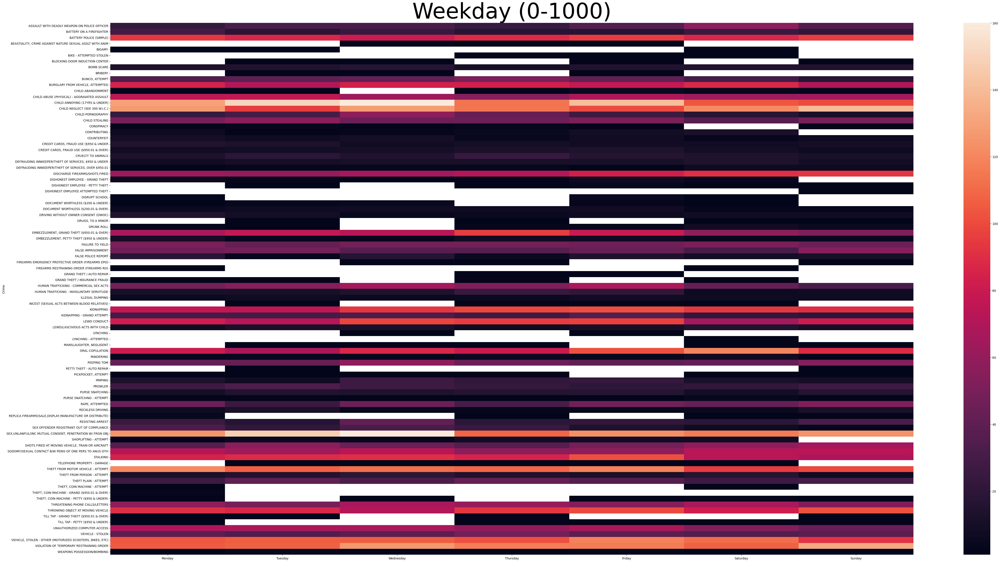

In [623]:
start, to = 0, 1000

show_heatmap(hour_crime, "Hour", start, to, 60, 32)
show_heatmap(light_crime, "Light", start, to, 60, 32)
show_heatmap(weekday_crime, "Weekday", start, to, 60, 32)

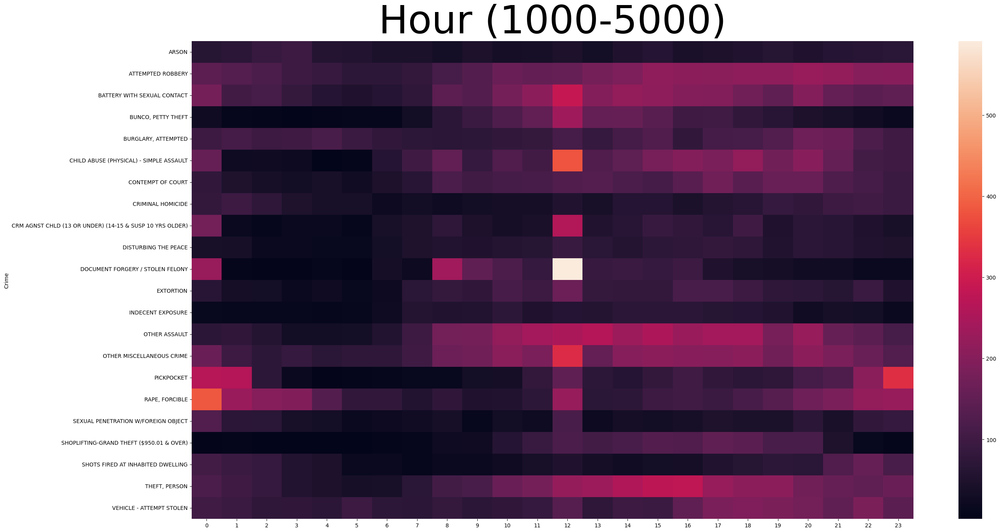

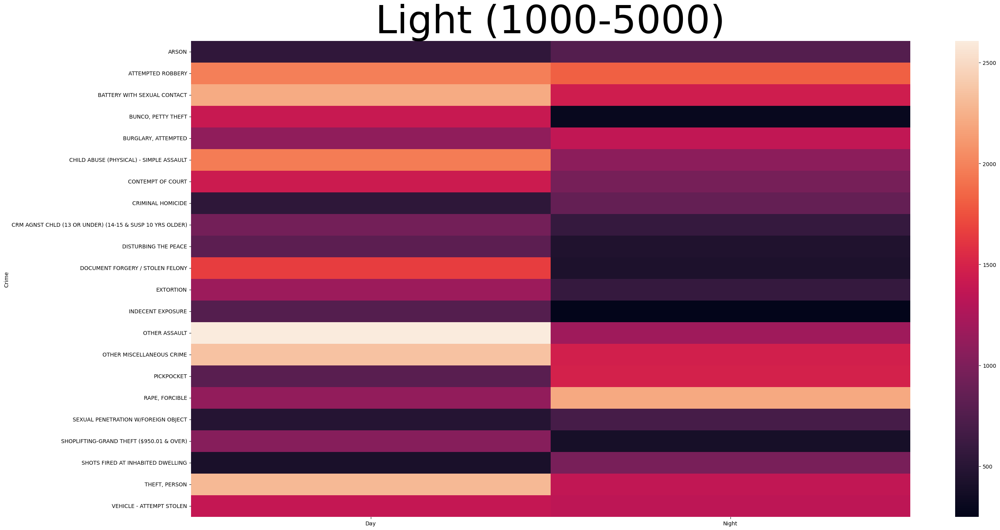

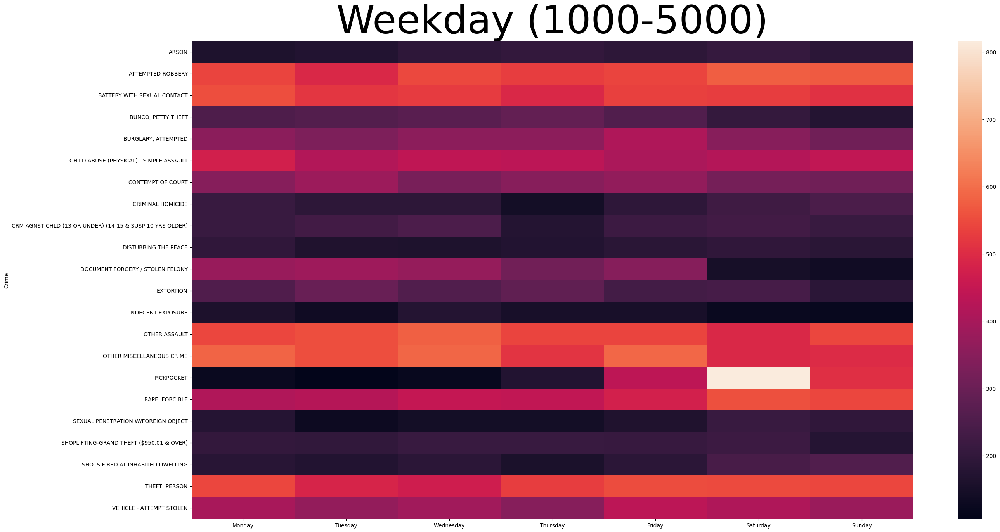

In [624]:
start, to = 1000, 5000

show_heatmap(hour_crime, "Hour", start, to)
show_heatmap(light_crime, "Light", start, to)
show_heatmap(weekday_crime, "Weekday", start, to)

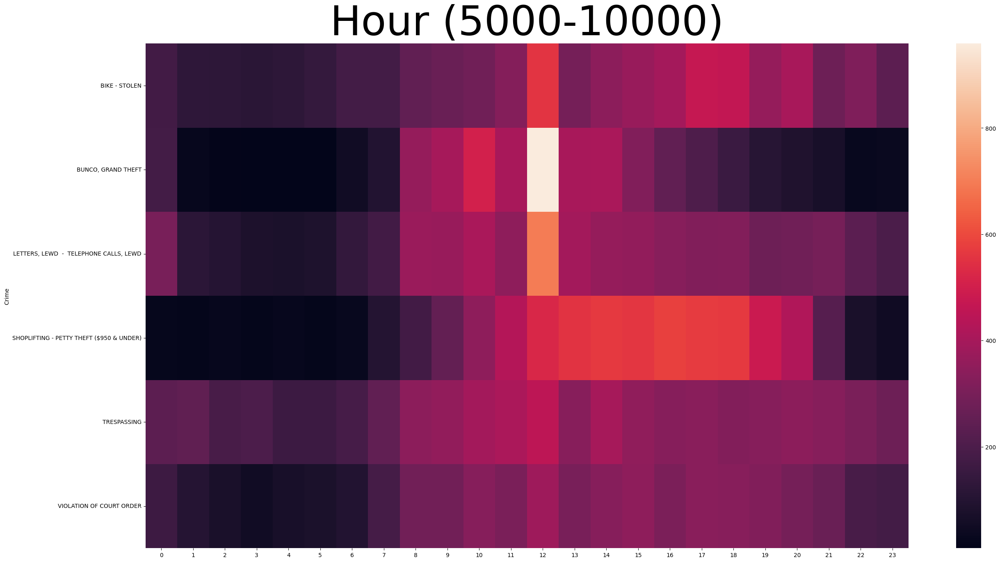

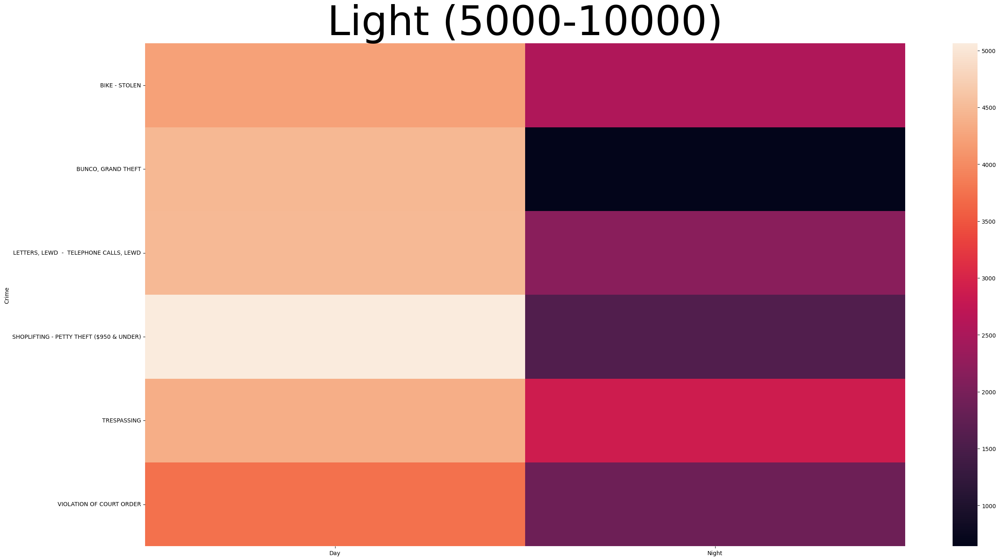

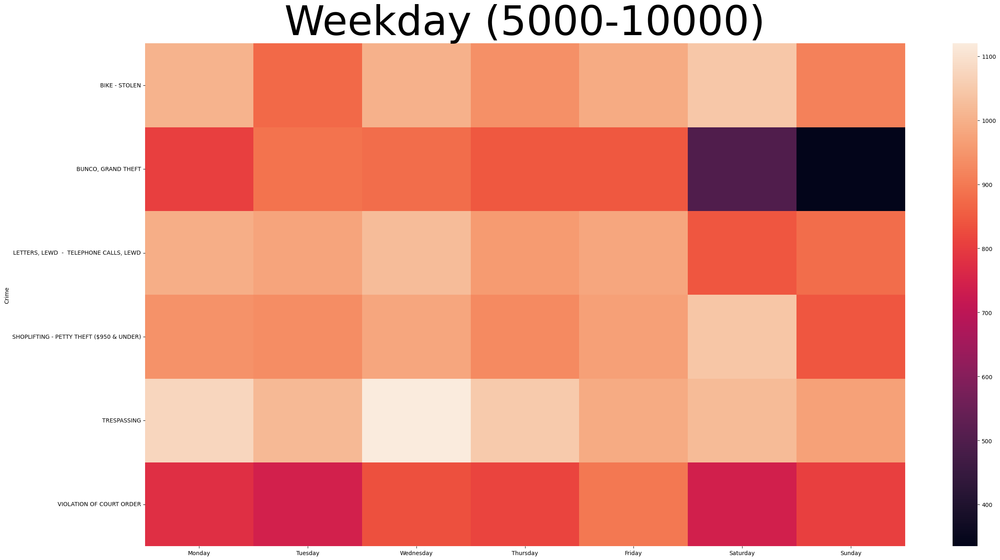

In [625]:
start, to = 5000, 10000

show_heatmap(hour_crime, "Hour", start, to)
show_heatmap(light_crime, "Light", start, to)
show_heatmap(weekday_crime, "Weekday", start, to)

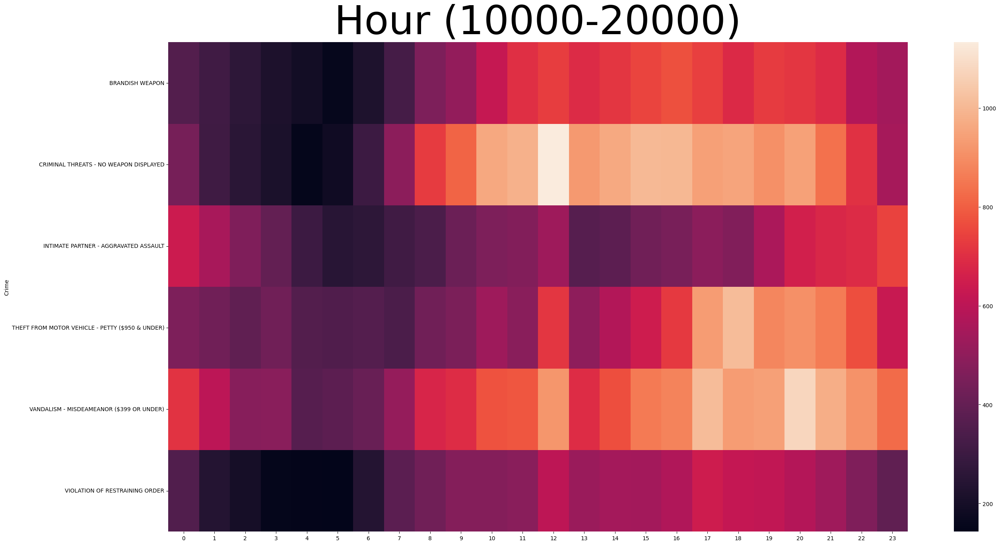

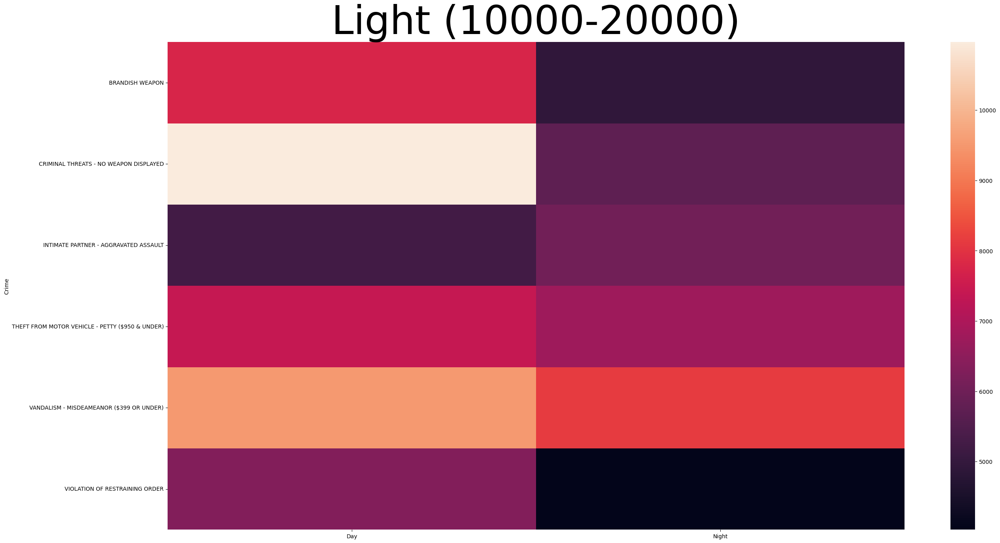

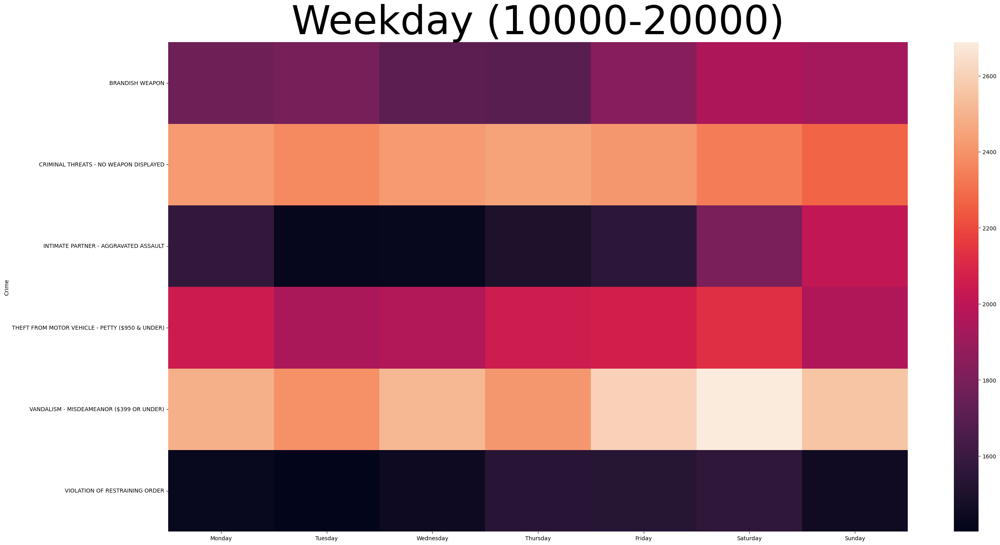

In [626]:
start, to = 10000, 20000

show_heatmap(hour_crime, "Hour", start, to)
show_heatmap(light_crime, "Light", start, to)
show_heatmap(weekday_crime, "Weekday", start, to)

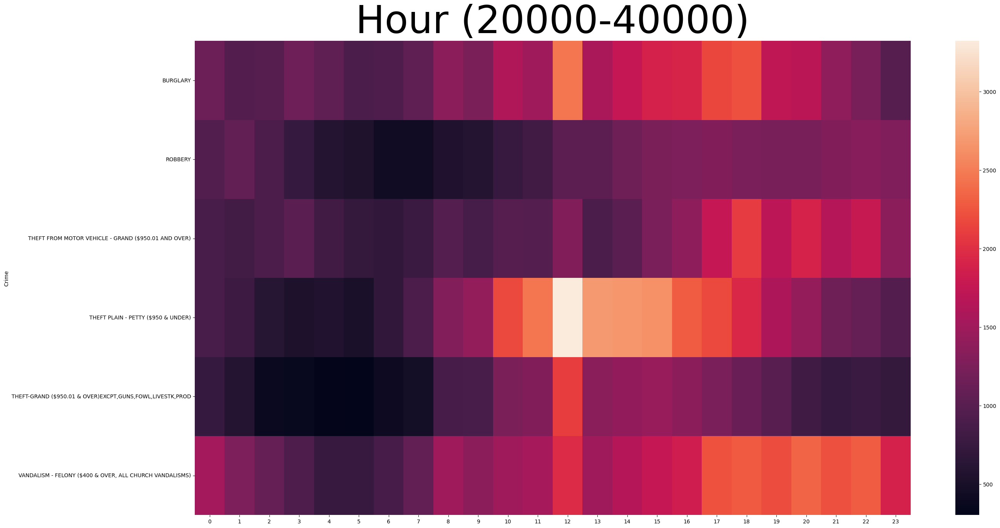

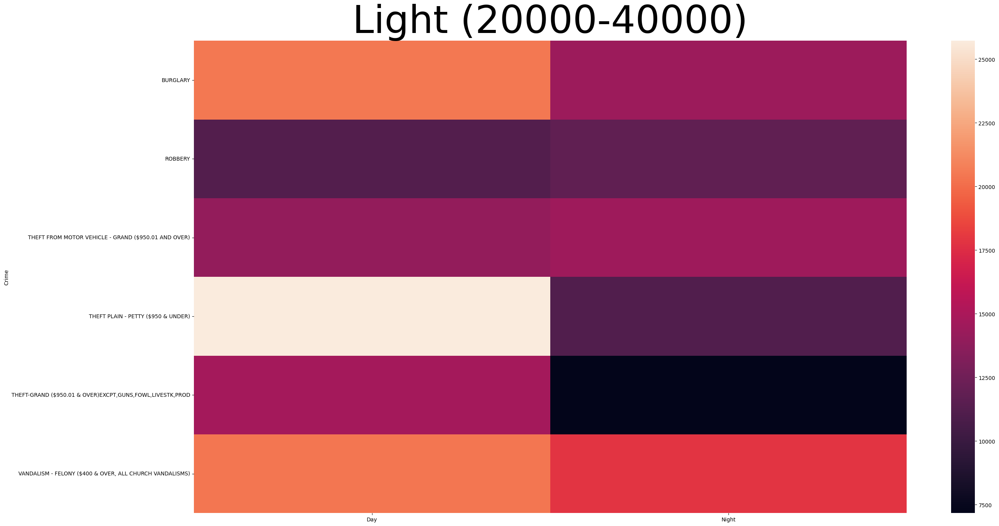

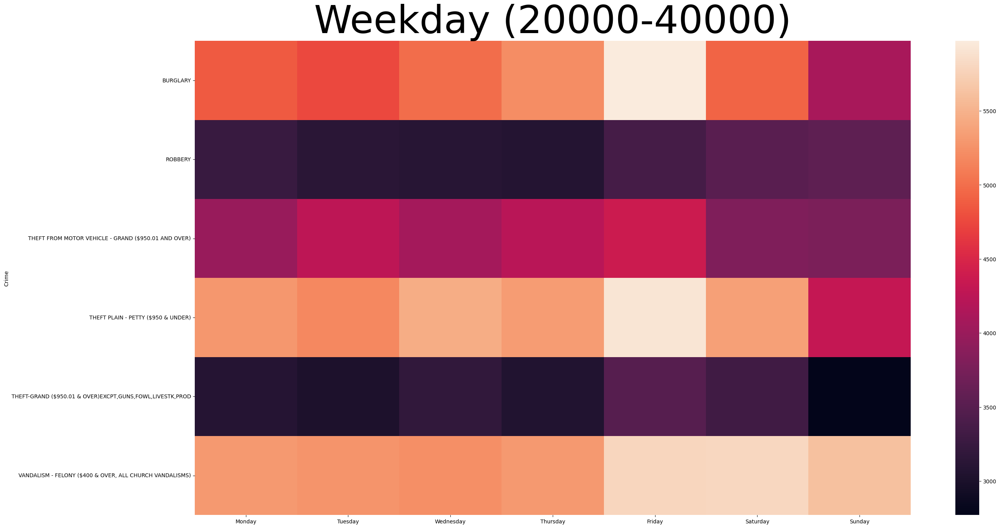

In [627]:
start, to = 20000, 40000

show_heatmap(hour_crime, "Hour", start, to)
show_heatmap(light_crime, "Light", start, to)
show_heatmap(weekday_crime, "Weekday", start, to)

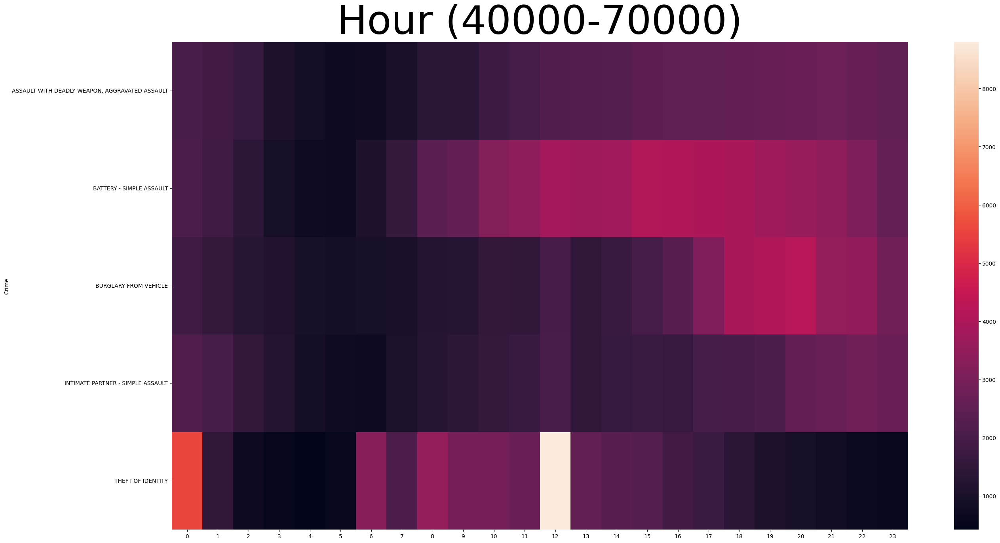

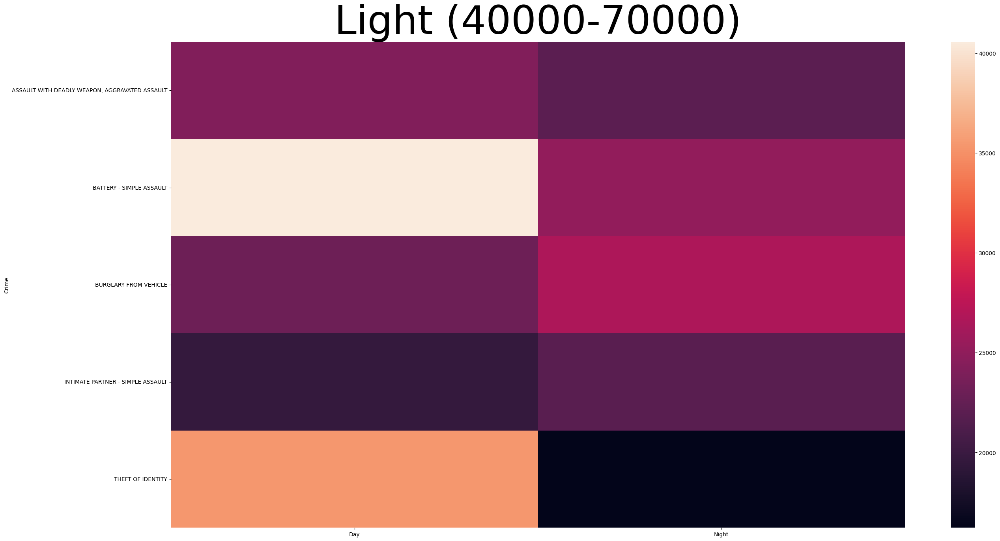

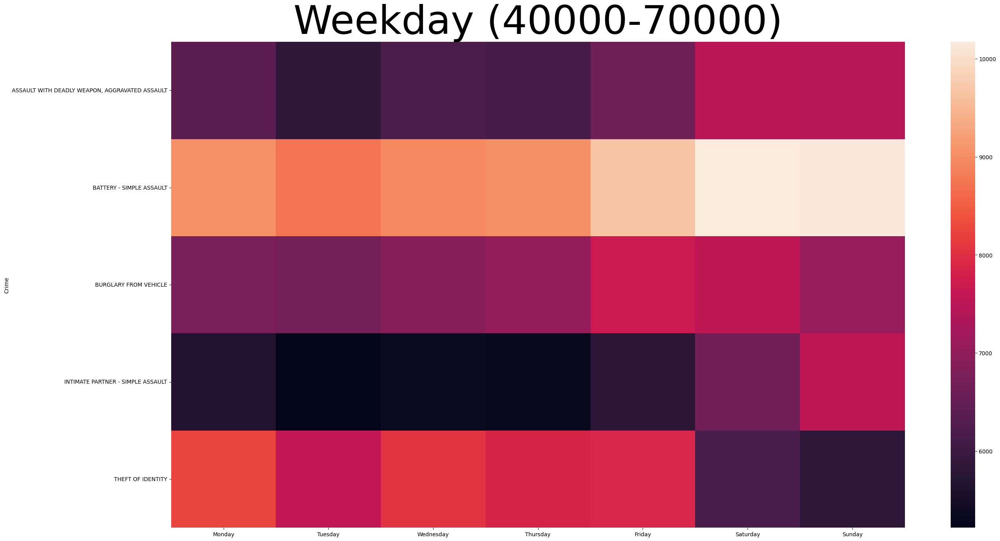

In [628]:
start, to = 40000, 70000

show_heatmap(hour_crime, "Hour", start, to)
show_heatmap(light_crime, "Light", start, to)
show_heatmap(weekday_crime, "Weekday", start, to)

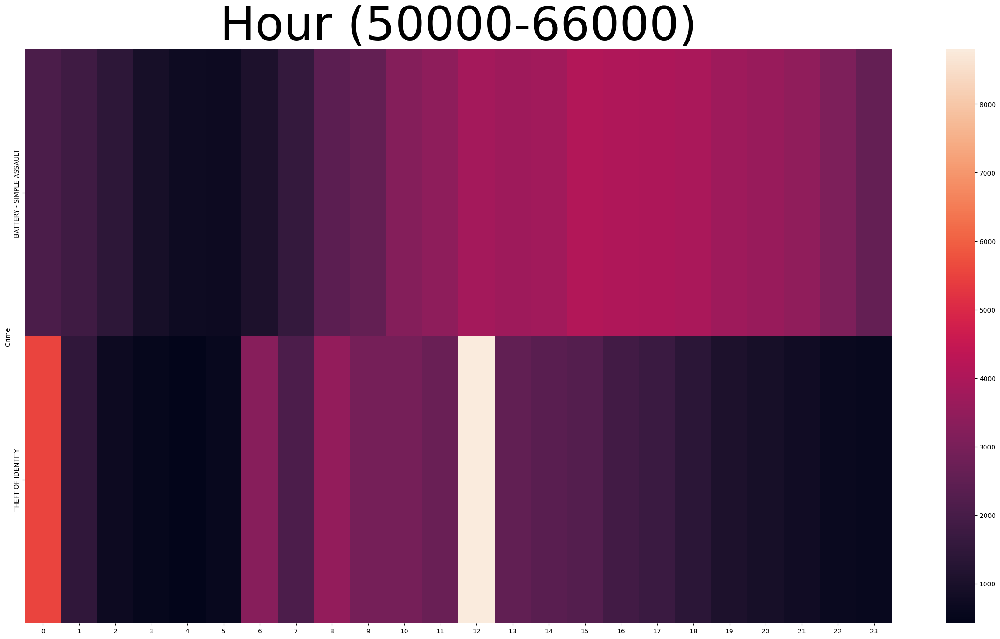

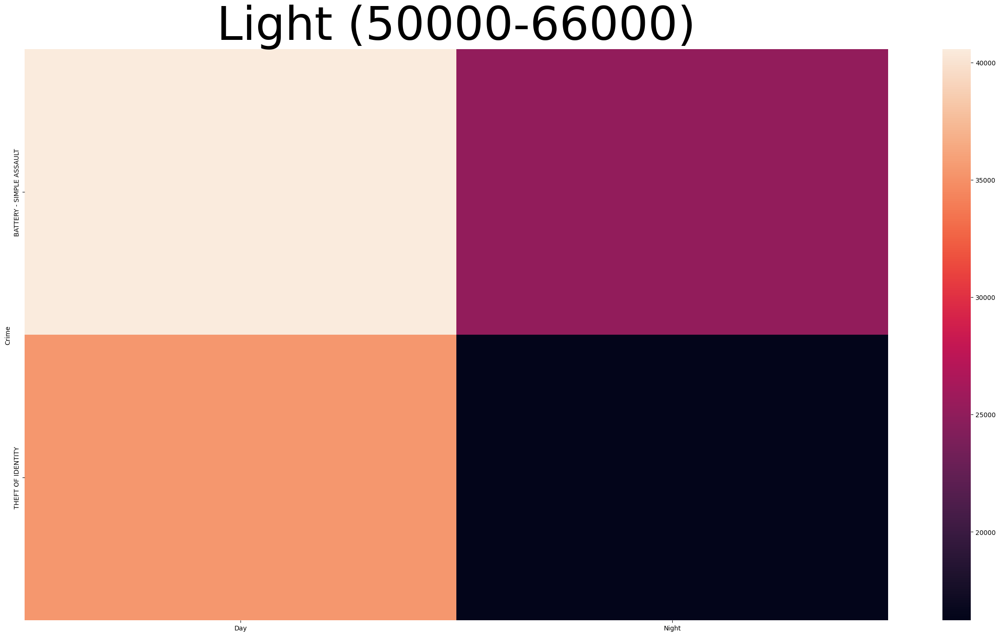

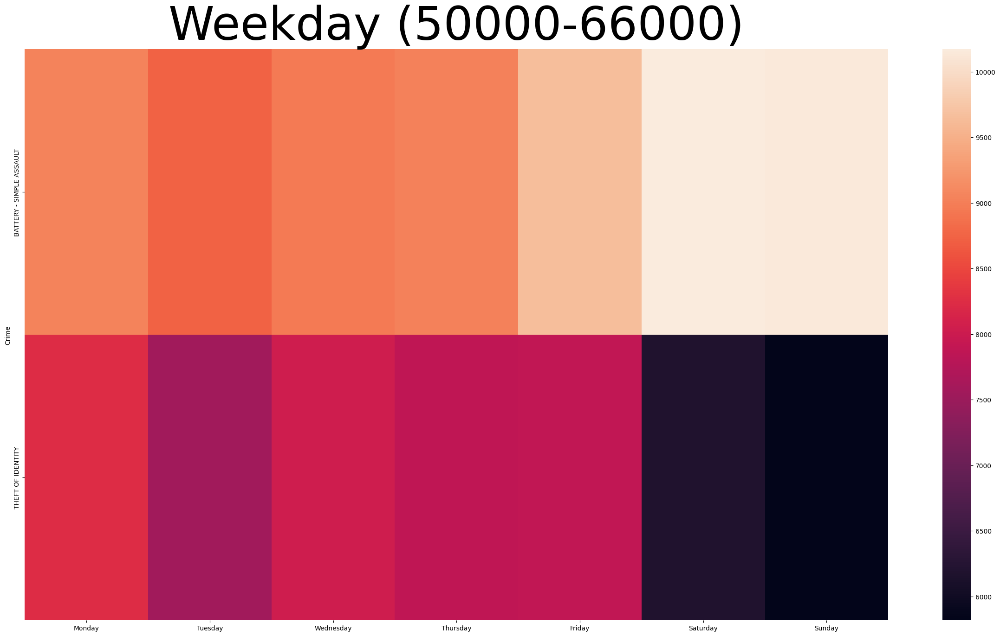

In [635]:
start, to = 50000, 66000

show_heatmap(hour_crime, "Hour", start, to)
show_heatmap(light_crime, "Light", start, to)
show_heatmap(weekday_crime, "Weekday", start, to)

# Ratio of Crimes

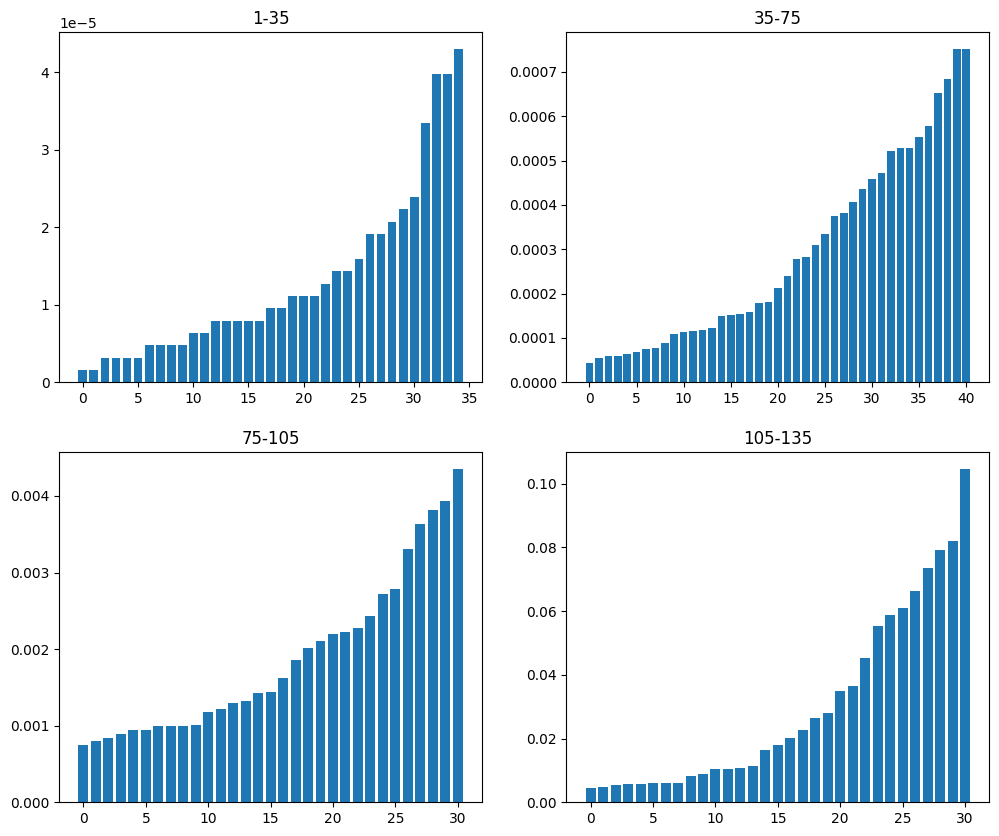

<Figure size 10000x8000 with 0 Axes>

In [630]:
import operator

y = df["Crm Cd Desc"].value_counts()

rates = {}
for k in y.keys():
    rates[k] = y[k]/sum(y)

sorted_dict = dict(sorted(rates.items(), key=operator.itemgetter(1)))

sub_dict = dict(list(sorted_dict.items())[:35])
sub_dict2 = dict(list(sorted_dict.items())[34:75])
sub_dict3 = dict(list(sorted_dict.items())[74:105])
sub_dict4 = dict(list(sorted_dict.items())[104:])

# Create subplots and plot the data
fig, axs = plt.subplots(2, 2, figsize=(12, 10))

# Plotting for subplot 1
axs[0, 0].bar(range(len(sub_dict)), sub_dict.values())
axs[0, 0].set_title('1-35')

# Plotting for subplot 2
axs[0, 1].bar(range(len(sub_dict2)), sub_dict2.values())
axs[0, 1].set_title('35-75')

# Plotting for subplot 3
axs[1, 0].bar(range(len(sub_dict3)), sub_dict3.values())
axs[1, 0].set_title('75-105')

# Plotting for subplot 4
axs[1, 1].bar(range(len(sub_dict4)), sub_dict4.values())
axs[1, 1].set_title('105-135')

# plt.bar(range(len(sub_dict)), list(sub_dict.values()), align='center')
# plt.xticks(range(len(sub_dict)), list(sub_dict.keys()), rotation=90, fontsize=4)

# plt.subplots_adjust(bottom=0.5)
plt.figure(figsize=(100, 80))

# Adjust layout and display the plot
plt.tight_layout()
plt.show()

# Top 20 Crimes and their occurence ratio, with Animation (for Fun)

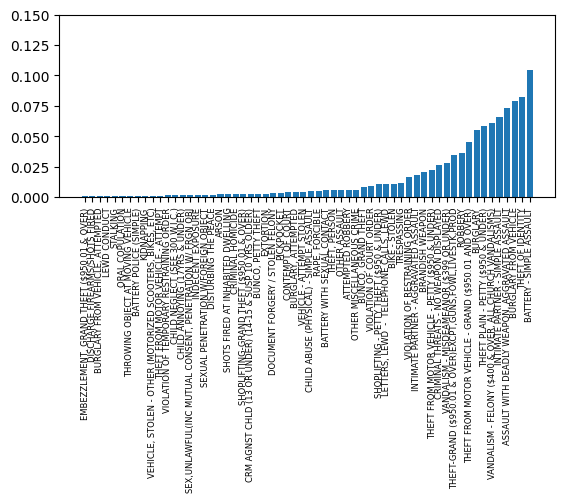

<Figure size 10000x8000 with 0 Axes>

In [631]:
import operator
import matplotlib.pyplot as plt
from matplotlib.animation import FuncAnimation
from IPython.display import HTML

# Assuming 'df' contains your data
# Calculate value counts for 'Crm Cd Desc'
y = df["Crm Cd Desc"].value_counts()

# Calculate rates
rates = {k: y[k] / sum(y) for k in y.keys()}

# Sort the dictionary by values
sorted_dict = dict(sorted(rates.items(), key=operator.itemgetter(1)))

# Take the top 50 items
sub_dict = dict(list(sorted_dict.items())[-60:])

# Set up the figure and axis
fig, ax = plt.subplots()
bars = ax.bar(range(len(sub_dict)), [0] * len(sub_dict), align='center', bottom=0)
plt.ylim(0, 0.15)
plt.xticks(range(len(sub_dict)), list(sub_dict.keys()), rotation=90, fontsize=6)
plt.subplots_adjust(bottom=0.5)
plt.figure(figsize=(100, 80))

# Update function for animation
def update(frame):
    key = list(sub_dict.keys())[frame]
    val = sub_dict[key]
    bars[frame].set_height(val)

# Create the animation
anim = FuncAnimation(fig, update, frames=len(sub_dict), interval=200)

# Display the animation using HTML
HTML(anim.to_jshtml())
